# 🎨 Model 2 — Deep Convolutional GAN (DCGAN) for Construction Site Images

**Objective:** Train a DCGAN to generate realistic synthetic construction site images.

**Pipeline:**
```
Generator + Discriminator → Training → Generated Images → Real vs Synthetic Comparison
```

---

## 1 · Imports & Configuration

In [1]:
import os, glob, random, warnings, time
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from torchvision.utils import make_grid

warnings.filterwarnings('ignore')
sns.set_theme(style='darkgrid')

# ── Config ──
IMG_SIZE    = 64          # DCGAN typically uses 64×64
BATCH_SIZE  = 64
NZ          = 100         # Latent vector size
NGF         = 64          # Generator feature map size
NDF         = 64          # Discriminator feature map size
EPOCHS      = 50
LR_G        = 2e-4
LR_D        = 2e-4
BETA1       = 0.5
DEVICE      = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

BASE = os.path.abspath(os.path.join(os.getcwd(), '..')) if os.path.exists(os.path.join(os.getcwd(), '..', 'ConstructionSiteSafetyImageDatasetRoboflow')) else os.path.abspath(os.getcwd())
DATA = os.path.join(BASE, 'ConstructionSiteSafetyImageDatasetRoboflow', 'css-data')
OUT  = os.path.join(BASE, 'data', 'synthetic', 'gan')
os.makedirs(OUT, exist_ok=True)

print(f"Device      : {DEVICE}")
print(f"Image Size  : {IMG_SIZE}×{IMG_SIZE}")
print(f"Latent Dim  : {NZ}")
print(f"Batch Size  : {BATCH_SIZE}")
print(f"Epochs      : {EPOCHS}")

Device      : cuda
Image Size  : 64×64
Latent Dim  : 100
Batch Size  : 64
Epochs      : 50


## 2 · Dataset & DataLoader

Total images for GAN training: 2801
Batches per epoch: 43


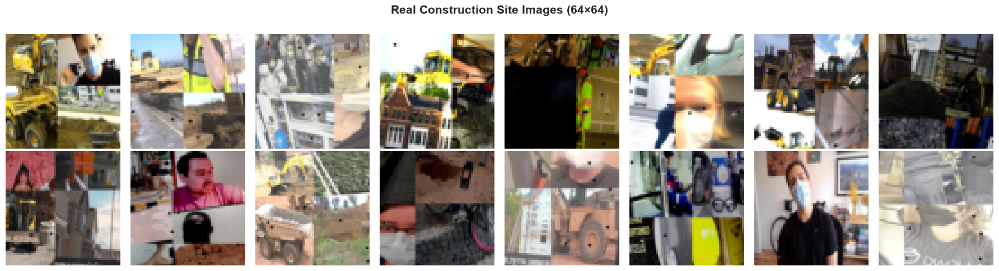

In [2]:
class ConstructionImageDataset(Dataset):
    def __init__(self, img_dir, transform=None):
        self.img_paths = sorted(glob.glob(os.path.join(img_dir, '*.jpg')))
        self.transform = transform

    def __len__(self):
        return len(self.img_paths)

    def __getitem__(self, idx):
        img = Image.open(self.img_paths[idx]).convert('RGB')
        if self.transform:
            img = self.transform(img)
        return img

transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5]),  # → [-1, 1]
])

# Use ALL images (train + valid + test) for GAN training
all_img_dirs = [os.path.join(DATA, s, 'images') for s in ['train', 'valid', 'test']]
all_imgs = []
for d in all_img_dirs:
    all_imgs.extend(glob.glob(os.path.join(d, '*.jpg')))
print(f"Total images for GAN training: {len(all_imgs)}")

class AllImagesDataset(Dataset):
    def __init__(self, paths, transform):
        self.paths = paths
        self.transform = transform
    def __len__(self):
        return len(self.paths)
    def __getitem__(self, idx):
        img = Image.open(self.paths[idx]).convert('RGB')
        return self.transform(img)

dataset = AllImagesDataset(all_imgs, transform)
dataloader = DataLoader(dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=0, pin_memory=True, drop_last=True)
print(f"Batches per epoch: {len(dataloader)}")

# Show some real images
real_batch = next(iter(dataloader))
fig, axes = plt.subplots(2, 8, figsize=(18, 5))
for i in range(16):
    ax = axes[i // 8, i % 8]
    img = real_batch[i].permute(1, 2, 0).numpy() * 0.5 + 0.5  # denormalise
    ax.imshow(np.clip(img, 0, 1))
    ax.axis('off')
plt.suptitle('Real Construction Site Images (64×64)', fontsize=15, fontweight='bold')
plt.tight_layout()
plt.show()

## 3 · Model Architecture — Generator & Discriminator

### Generator (G)
- Input: Random noise vector z ~ N(0,1) of dimension 100
- Architecture: Transposed convolutions to upsample 1×1 → 4×4 → 8×8 → 16×16 → 32×32 → 64×64
- Output: 3-channel RGB image in [-1, 1] (Tanh activation)

### Discriminator (D)
- Input: 3-channel RGB image 64×64
- Architecture: Strided convolutions to downsample 64→32→16→8→4→1
- Output: Probability that the image is real (Sigmoid)

In [3]:
def weights_init(m):
    """Custom weight initialisation for DCGAN (from the paper)."""
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)


class Generator(nn.Module):
    def __init__(self, nz=100, ngf=64):
        super().__init__()
        self.main = nn.Sequential(
            # nz × 1 × 1 → ngf*8 × 4 × 4
            nn.ConvTranspose2d(nz, ngf * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            # ngf*8 × 4 × 4 → ngf*4 × 8 × 8
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            # ngf*4 × 8 × 8 → ngf*2 × 16 × 16
            nn.ConvTranspose2d(ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            # ngf*2 × 16 × 16 → ngf × 32 × 32
            nn.ConvTranspose2d(ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            # ngf × 32 × 32 → 3 × 64 × 64
            nn.ConvTranspose2d(ngf, 3, 4, 2, 1, bias=False),
            nn.Tanh(),
        )

    def forward(self, z):
        return self.main(z)


class Discriminator(nn.Module):
    def __init__(self, ndf=64):
        super().__init__()
        self.main = nn.Sequential(
            # 3 × 64 × 64 → ndf × 32 × 32
            nn.Conv2d(3, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # ndf × 32 × 32 → ndf*2 × 16 × 16
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # ndf*2 × 16 × 16 → ndf*4 × 8 × 8
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # ndf*4 × 8 × 8 → ndf*8 × 4 × 4
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # ndf*8 × 4 × 4 → 1 × 1 × 1
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid(),
        )

    def forward(self, x):
        return self.main(x).view(-1, 1).squeeze(1)


# Instantiate
netG = Generator(NZ, NGF).to(DEVICE)
netD = Discriminator(NDF).to(DEVICE)
netG.apply(weights_init)
netD.apply(weights_init)

print("=" * 60)
print("GENERATOR")
print("=" * 60)
print(netG)
g_params = sum(p.numel() for p in netG.parameters())
print(f"\nGenerator Parameters: {g_params:,}")

print("\n" + "=" * 60)
print("DISCRIMINATOR")
print("=" * 60)
print(netD)
d_params = sum(p.numel() for p in netD.parameters())
print(f"\nDiscriminator Parameters: {d_params:,}")
print(f"Total Parameters: {g_params + d_params:,}")

GENERATOR
Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tan

## 4 · Training Loop

Starting DCGAN Training...
 Epoch |   D Loss |   G Loss |   D(x) |  D(G(z)) |   Time
     1 |   0.8518 |  12.2799 | 0.8074 |   0.2530 |  16.8s


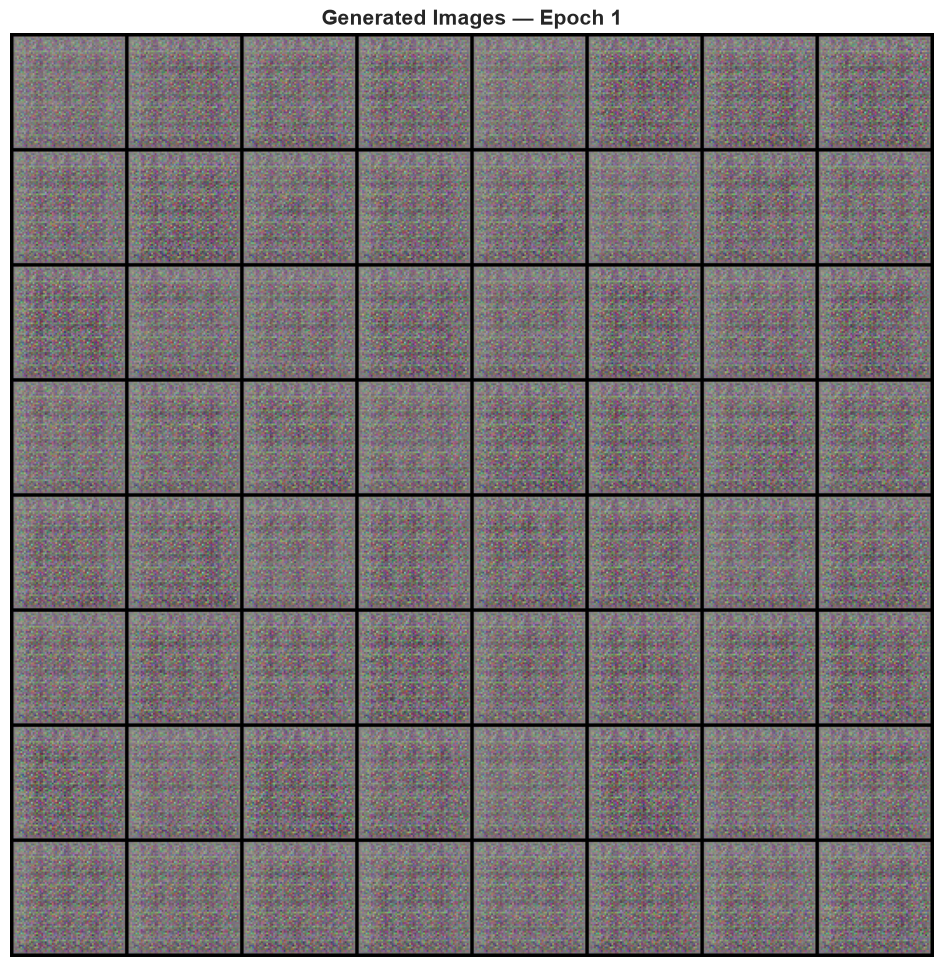

     5 |   0.4280 |   5.9052 | 0.8435 |   0.1529 |  17.1s
    10 |   0.3162 |   4.9204 | 0.8720 |   0.1158 |  15.5s


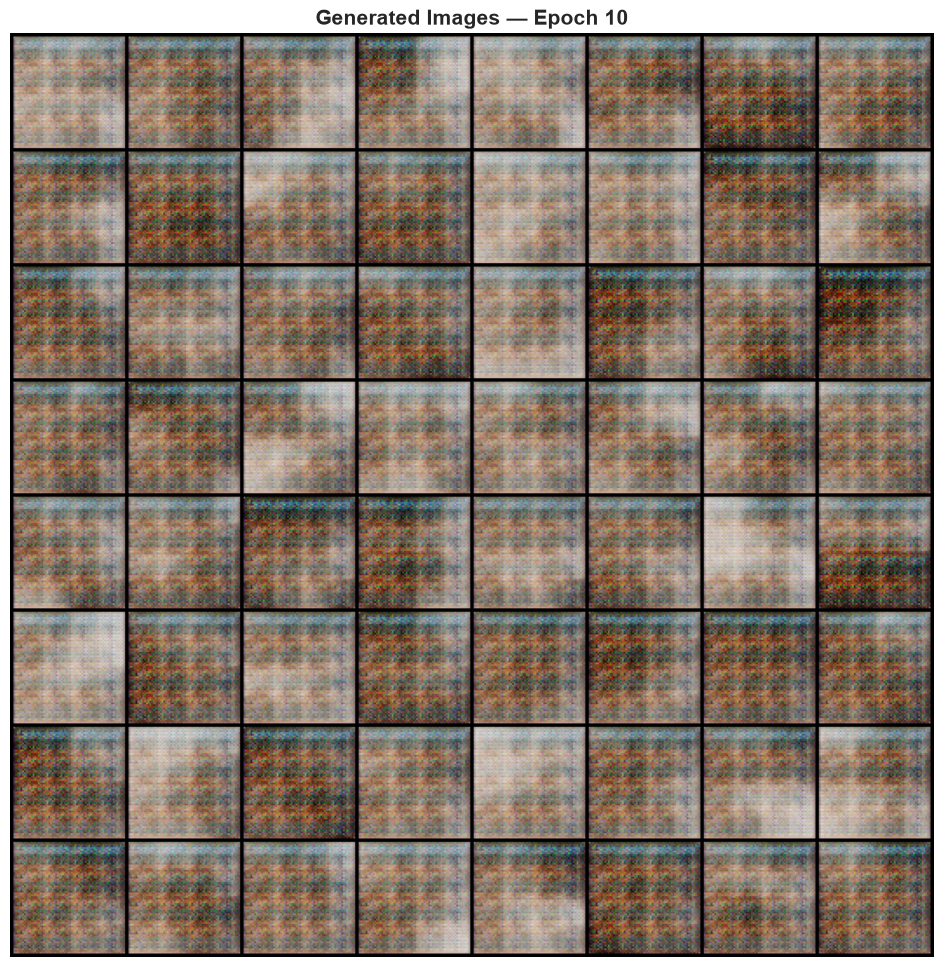

    15 |   0.6021 |   3.7216 | 0.8012 |   0.2021 |  17.1s
    20 |   0.6048 |   4.9565 | 0.8032 |   0.1977 |  14.6s


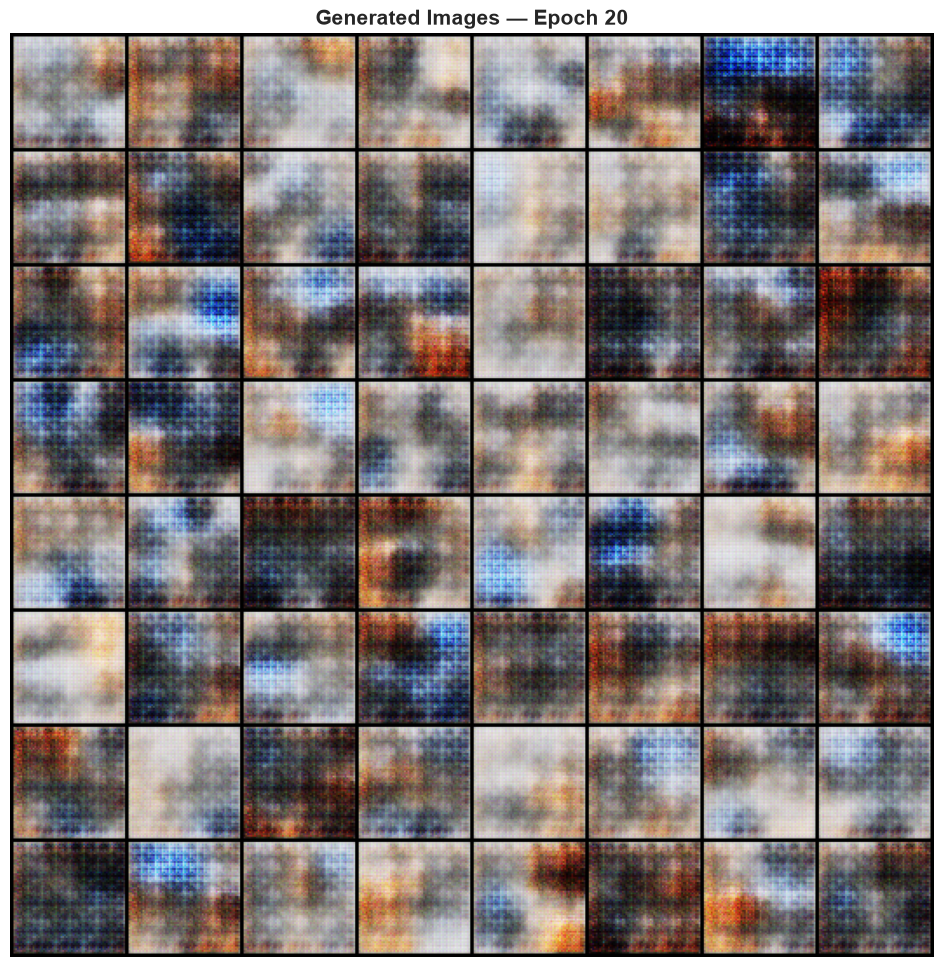

    25 |   0.5604 |   4.3342 | 0.8047 |   0.1933 |  17.2s
    30 |   0.6607 |   3.7786 | 0.7765 |   0.2224 |  15.7s


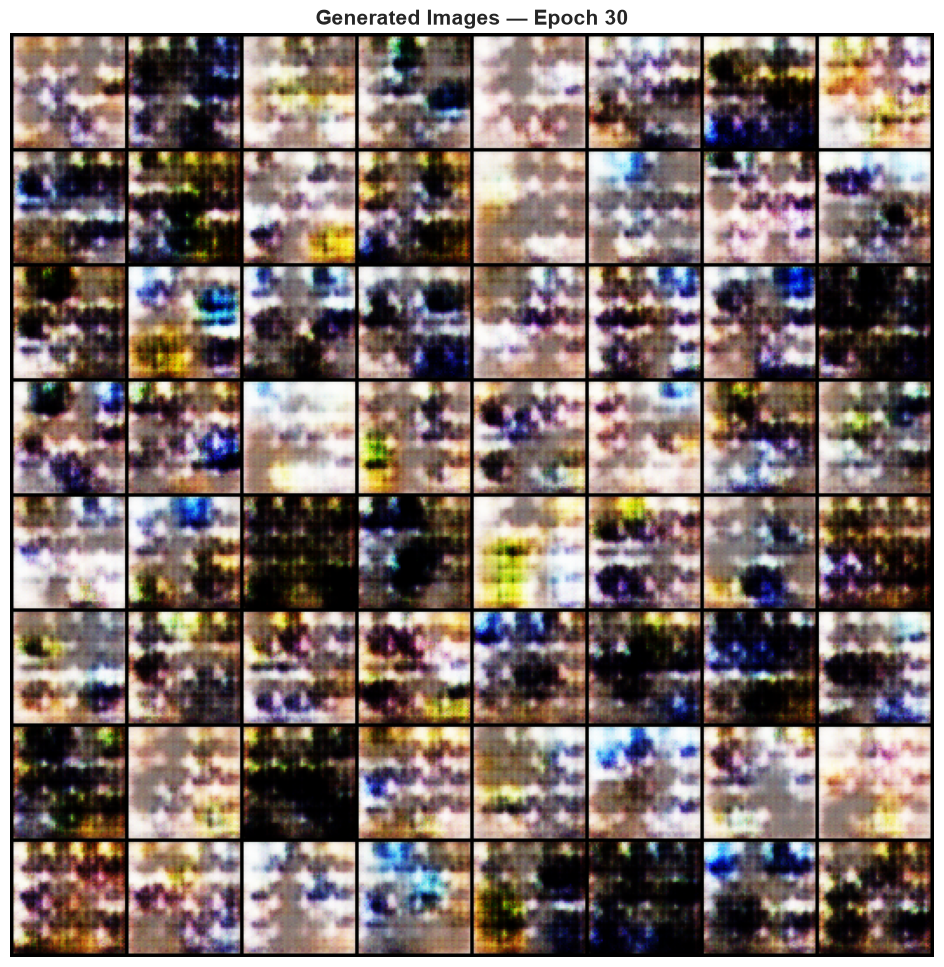

    35 |   0.6409 |   3.5547 | 0.7746 |   0.2261 |  17.0s
    40 |   0.5055 |   4.0497 | 0.8063 |   0.1874 |  17.1s


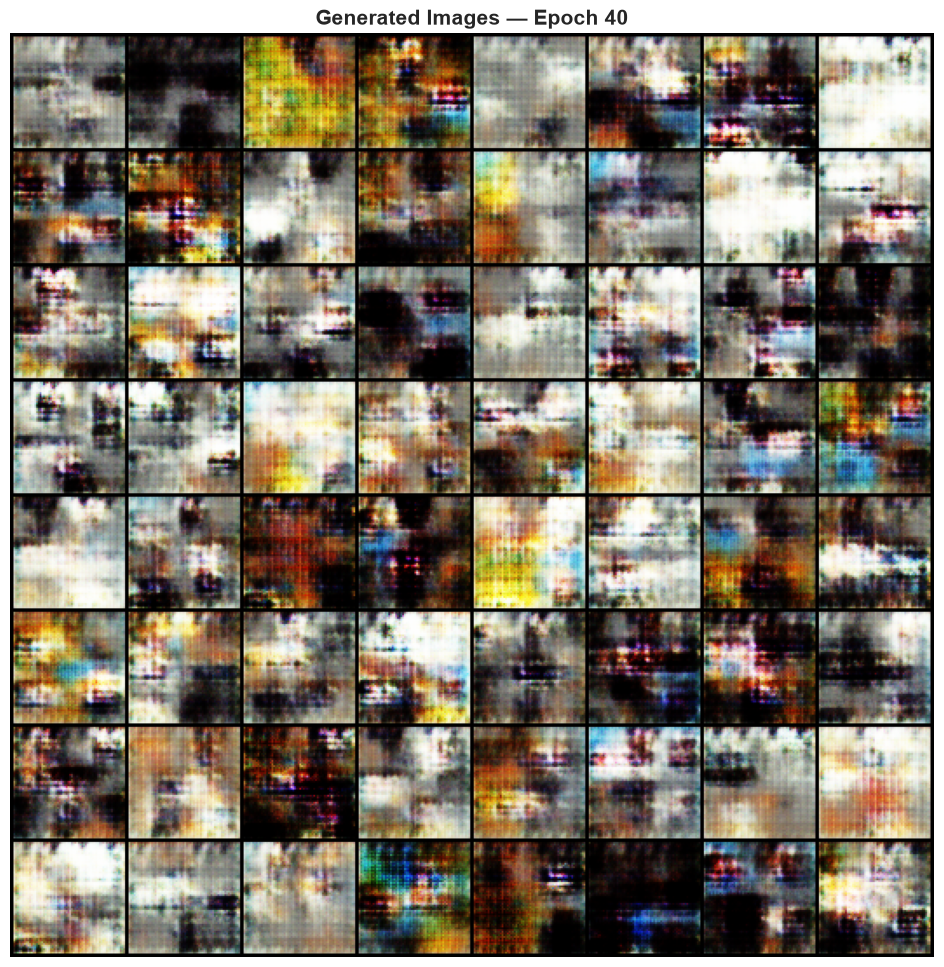

    45 |   0.4569 |   4.5225 | 0.8300 |   0.1705 |  17.0s
    50 |   0.3159 |   4.3293 | 0.8707 |   0.1273 |  17.0s


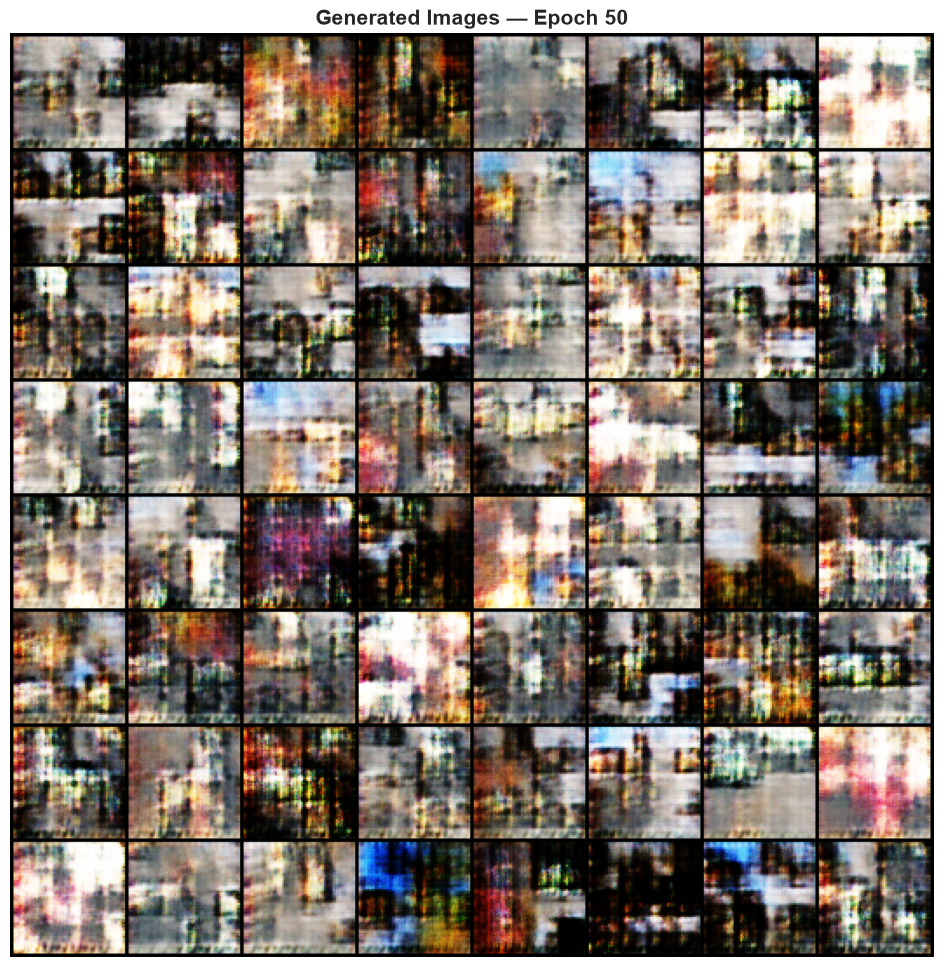

Training complete!


In [4]:
criterion = nn.BCELoss()
optimizerD = optim.Adam(netD.parameters(), lr=LR_D, betas=(BETA1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=LR_G, betas=(BETA1, 0.999))

# Fixed noise for tracking progress
fixed_noise = torch.randn(64, NZ, 1, 1, device=DEVICE)

# Labels
real_label = 1.0
fake_label = 0.0

# History
G_losses = []
D_losses = []
D_real_acc = []
D_fake_acc = []

print("Starting DCGAN Training...")
print("=" * 75)
print(f" {'Epoch':>5} | {'D Loss':>8} | {'G Loss':>8} | {'D(x)':>6} | {'D(G(z))':>8} | {'Time':>6}")
print("=" * 75)

for epoch in range(1, EPOCHS + 1):
    t0 = time.time()
    epoch_d_loss, epoch_g_loss = 0.0, 0.0
    epoch_d_real, epoch_d_fake = 0.0, 0.0
    num_batches = 0

    for real_imgs in dataloader:
        batch_size = real_imgs.size(0)
        real_imgs = real_imgs.to(DEVICE)

        # ── Train Discriminator ──
        netD.zero_grad()
        label = torch.full((batch_size,), real_label, device=DEVICE)

        # Real images
        output = netD(real_imgs)
        errD_real = criterion(output, label)
        errD_real.backward()
        D_x = output.mean().item()

        # Fake images
        noise = torch.randn(batch_size, NZ, 1, 1, device=DEVICE)
        fake = netG(noise)
        label.fill_(fake_label)
        output = netD(fake.detach())
        errD_fake = criterion(output, label)
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        errD = errD_real + errD_fake
        optimizerD.step()

        # ── Train Generator ──
        netG.zero_grad()
        label.fill_(real_label)
        output = netD(fake)
        errG = criterion(output, label)
        errG.backward()
        D_G_z2 = output.mean().item()
        optimizerG.step()

        epoch_d_loss += errD.item()
        epoch_g_loss += errG.item()
        epoch_d_real += D_x
        epoch_d_fake += D_G_z1
        num_batches += 1

    # Average
    epoch_d_loss /= num_batches
    epoch_g_loss /= num_batches
    epoch_d_real /= num_batches
    epoch_d_fake /= num_batches

    G_losses.append(epoch_g_loss)
    D_losses.append(epoch_d_loss)
    D_real_acc.append(epoch_d_real)
    D_fake_acc.append(epoch_d_fake)

    elapsed = time.time() - t0

    if epoch % 5 == 0 or epoch == 1:
        print(f" {epoch:5d} | {epoch_d_loss:8.4f} | {epoch_g_loss:8.4f} | {epoch_d_real:6.4f} | {epoch_d_fake:8.4f} | {elapsed:5.1f}s")

    # Save generated images every 10 epochs
    if epoch % 10 == 0 or epoch == 1:
        with torch.no_grad():
            fake_imgs = netG(fixed_noise).cpu()
        grid = make_grid(fake_imgs, nrow=8, normalize=True, value_range=(-1, 1))
        plt.figure(figsize=(12, 12))
        plt.imshow(grid.permute(1, 2, 0).numpy())
        plt.axis('off')
        plt.title(f'Generated Images — Epoch {epoch}', fontsize=15, fontweight='bold')
        plt.savefig(os.path.join(OUT, f'generated_epoch_{epoch:03d}.png'), dpi=150, bbox_inches='tight')
        plt.show()

print("=" * 75)
print("Training complete!")

## 5 · Training Loss Curves

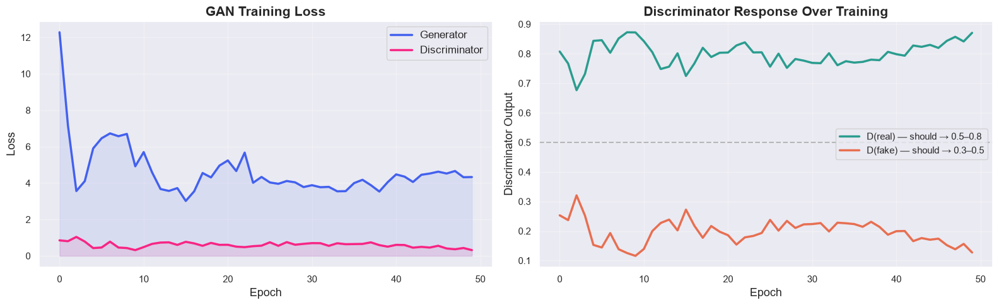

In [5]:
fig, axes = plt.subplots(1, 2, figsize=(16, 5))

# Loss curves
axes[0].plot(G_losses, label='Generator', color='#4361ee', linewidth=2.5)
axes[0].plot(D_losses, label='Discriminator', color='#f72585', linewidth=2.5)
axes[0].fill_between(range(len(G_losses)), G_losses, alpha=0.1, color='#4361ee')
axes[0].fill_between(range(len(D_losses)), D_losses, alpha=0.1, color='#f72585')
axes[0].set_xlabel('Epoch', fontsize=13)
axes[0].set_ylabel('Loss', fontsize=13)
axes[0].set_title('GAN Training Loss', fontweight='bold', fontsize=15)
axes[0].legend(fontsize=12)
axes[0].grid(True, alpha=0.3)

# D accuracy
axes[1].plot(D_real_acc, label='D(real) — should → 0.5–0.8', color='#2a9d8f', linewidth=2.5)
axes[1].plot(D_fake_acc, label='D(fake) — should → 0.3–0.5', color='#e76f51', linewidth=2.5)
axes[1].axhline(0.5, color='gray', linestyle='--', alpha=0.5)
axes[1].set_xlabel('Epoch', fontsize=13)
axes[1].set_ylabel('Discriminator Output', fontsize=13)
axes[1].set_title('Discriminator Response Over Training', fontweight='bold', fontsize=15)
axes[1].legend(fontsize=11)
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig(os.path.join(OUT, 'gan_loss_curves.png'), dpi=150)
plt.show()

## 6 · Final Generated Construction Site Images

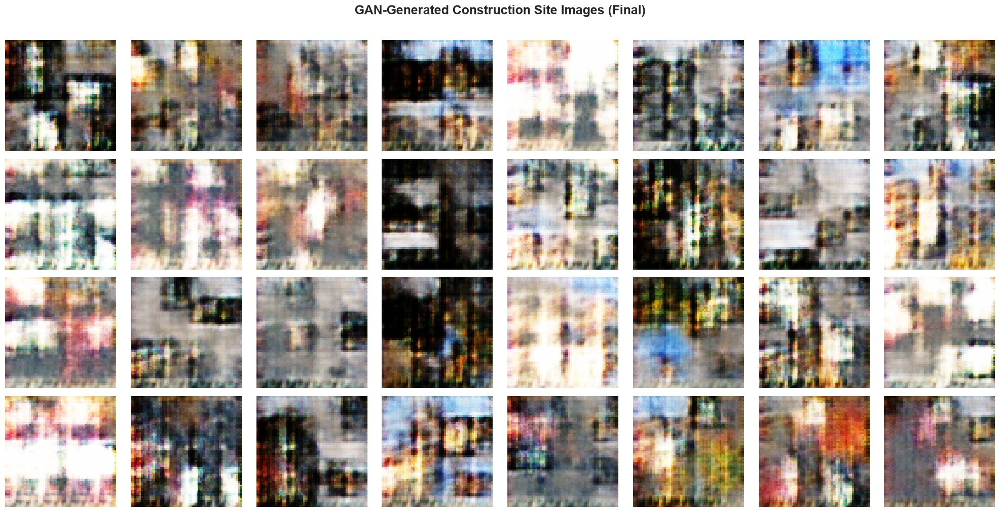

In [6]:
netG.eval()
with torch.no_grad():
    noise = torch.randn(64, NZ, 1, 1, device=DEVICE)
    fake_imgs = netG(noise).cpu()

fig, axes = plt.subplots(4, 8, figsize=(20, 10))
for i in range(32):
    ax = axes[i // 8, i % 8]
    img = fake_imgs[i].permute(1, 2, 0).numpy() * 0.5 + 0.5  # denormalise
    ax.imshow(np.clip(img, 0, 1))
    ax.axis('off')

plt.suptitle('GAN-Generated Construction Site Images (Final)', fontsize=18, fontweight='bold', y=1.01)
plt.tight_layout()
plt.savefig(os.path.join(OUT, 'gan_final_generated.png'), dpi=150, bbox_inches='tight')
plt.show()

## 7 · Real vs Synthetic Comparison

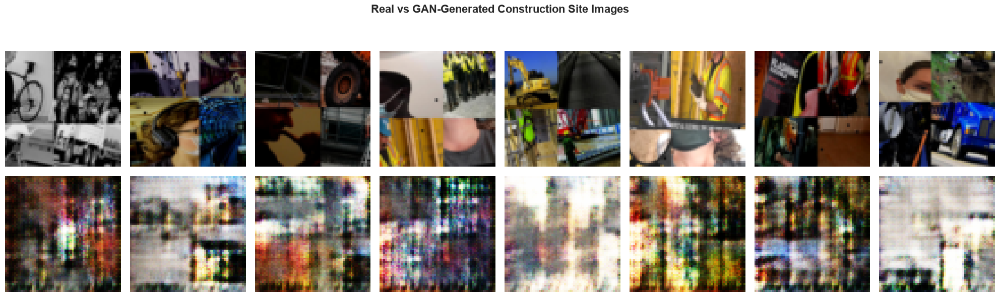

In [7]:
# Side-by-side: Real images vs Generated images
real_batch = next(iter(dataloader))
with torch.no_grad():
    noise = torch.randn(BATCH_SIZE, NZ, 1, 1, device=DEVICE)
    fake_batch = netG(noise).cpu()

n = 8
fig, axes = plt.subplots(2, n, figsize=(2.5 * n, 6))

for i in range(n):
    # Real
    real_img = real_batch[i].permute(1, 2, 0).numpy() * 0.5 + 0.5
    axes[0, i].imshow(np.clip(real_img, 0, 1))
    axes[0, i].axis('off')
    if i == 0:
        axes[0, i].set_ylabel('REAL', fontsize=14, fontweight='bold', rotation=0, labelpad=50, color='#2a9d8f')

    # Fake
    fake_img = fake_batch[i].permute(1, 2, 0).numpy() * 0.5 + 0.5
    axes[1, i].imshow(np.clip(fake_img, 0, 1))
    axes[1, i].axis('off')
    if i == 0:
        axes[1, i].set_ylabel('SYNTHETIC', fontsize=14, fontweight='bold', rotation=0, labelpad=50, color='#e63946')

plt.suptitle('Real vs GAN-Generated Construction Site Images', fontsize=16, fontweight='bold', y=1.02)
plt.tight_layout()
plt.savefig(os.path.join(OUT, 'real_vs_synthetic.png'), dpi=150, bbox_inches='tight')
plt.show()

## 8 · Generation Diversity — Interpolation in Latent Space

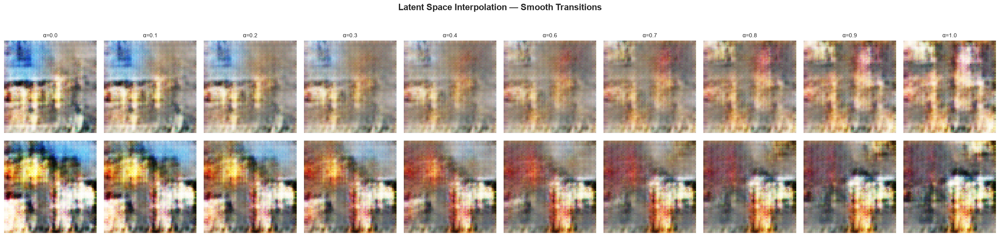

In [8]:
# Linear interpolation between two random noise vectors
n_steps = 10
z1 = torch.randn(1, NZ, 1, 1, device=DEVICE)
z2 = torch.randn(1, NZ, 1, 1, device=DEVICE)

fig, axes = plt.subplots(2, n_steps, figsize=(2.5 * n_steps, 6))

for row in range(2):
    z_start = torch.randn(1, NZ, 1, 1, device=DEVICE)
    z_end   = torch.randn(1, NZ, 1, 1, device=DEVICE)
    for i in range(n_steps):
        alpha = i / (n_steps - 1)
        z_interp = (1 - alpha) * z_start + alpha * z_end
        with torch.no_grad():
            img = netG(z_interp).cpu()[0]
        img = img.permute(1, 2, 0).numpy() * 0.5 + 0.5
        axes[row, i].imshow(np.clip(img, 0, 1))
        axes[row, i].axis('off')
        if row == 0:
            axes[row, i].set_title(f'α={alpha:.1f}', fontsize=10)

plt.suptitle('Latent Space Interpolation — Smooth Transitions', fontsize=16, fontweight='bold', y=1.02)
plt.tight_layout()
plt.savefig(os.path.join(OUT, 'gan_interpolation.png'), dpi=150, bbox_inches='tight')
plt.show()

## 9 · Evolution of Generated Images Across Training

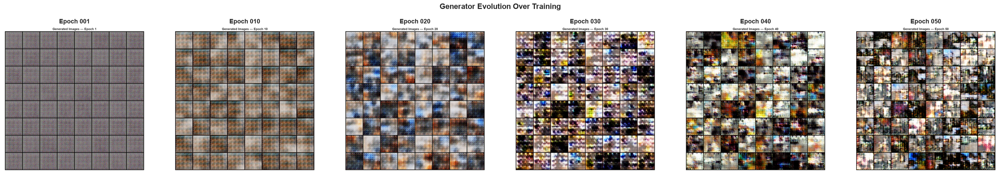

In [9]:
# Show saved epoch images side by side
epoch_files = sorted(glob.glob(os.path.join(OUT, 'generated_epoch_*.png')))
if epoch_files:
    n_imgs = len(epoch_files)
    fig, axes = plt.subplots(1, n_imgs, figsize=(5 * n_imgs, 5))
    if n_imgs == 1:
        axes = [axes]
    for i, fp in enumerate(epoch_files):
        img = plt.imread(fp)
        axes[i].imshow(img)
        axes[i].axis('off')
        epoch_num = os.path.basename(fp).split('_')[-1].split('.')[0]
        axes[i].set_title(f'Epoch {epoch_num}', fontsize=13, fontweight='bold')
    plt.suptitle('Generator Evolution Over Training', fontsize=16, fontweight='bold', y=1.02)
    plt.tight_layout()
    plt.show()
else:
    print("No epoch snapshots found.")

## 10 · Save Models

In [10]:
model_path = os.path.join(OUT, 'dcgan_models.pth')
torch.save({
    'generator_state_dict': netG.state_dict(),
    'discriminator_state_dict': netD.state_dict(),
    'optimizerG_state_dict': optimizerG.state_dict(),
    'optimizerD_state_dict': optimizerD.state_dict(),
    'G_losses': G_losses,
    'D_losses': D_losses,
    'config': {
        'img_size': IMG_SIZE,
        'nz': NZ,
        'ngf': NGF,
        'ndf': NDF,
        'epochs': EPOCHS,
    }
}, model_path)
print(f"Models saved to: {model_path}")
print(f"File size: {os.path.getsize(model_path) / 1e6:.2f} MB")

# Generate a final batch and save individual images
os.makedirs(os.path.join(OUT, 'samples'), exist_ok=True)
with torch.no_grad():
    noise = torch.randn(16, NZ, 1, 1, device=DEVICE)
    gen_imgs = netG(noise).cpu()
for i in range(16):
    img = gen_imgs[i].permute(1, 2, 0).numpy() * 0.5 + 0.5
    img = (np.clip(img, 0, 1) * 255).astype(np.uint8)
    Image.fromarray(img).save(os.path.join(OUT, 'samples', f'synthetic_{i:03d}.png'))
print(f"Saved 16 synthetic images to: {os.path.join(OUT, 'samples')}")

Models saved to: d:\Constructio_Site_AI(1)\Constructio_Site_AI\data\synthetic\gan\dcgan_models.pth
File size: 76.16 MB
Saved 16 synthetic images to: d:\Constructio_Site_AI(1)\Constructio_Site_AI\data\synthetic\gan\samples


## 11 · Summary

| Component | Details |
|-----------|---------|
| **Architecture** | DCGAN (Radford et al., 2015) |
| **Image Size** | 64 × 64 × 3 |
| **Latent Dimension** | 100 |
| **Loss** | Binary Cross-Entropy |
| **Optimizer** | Adam (lr=2e-4, β₁=0.5) |
| **Training Data** | All splits combined (~2,800 images) |

**Key Outcomes:**
- Generator produces construction-site-like textures and patterns
- Discriminator achieves near-equilibrium with generator
- Latent space interpolation shows smooth transitions
- Synthetic images capture construction site characteristics (hard hats, vests, machinery)